<h1>Méthode suivie</h1>

Comme détaillé dans le rapport joint (livrable 1), nous allons suivre des traitements en cascade sur les planches de jeu "Où est Charlie ?" afin d'être en mesure de résoudre le jeu. 

<h3>Etape 1 : Réduction de l’espace de recherche par filtrage colorim´ etrique</h3>

Dans cette étape, nous allons réduire l'espace de recherche à l'aide d'un filtrage colorimétrique, en tirant profit de la signature visuelle forte de notre cible : Charlie (rayures rouges et blanches notamment). Nous allons commencer par convertir notre planche dans l'espace HSV pour séparer l'information chromatique de l'intensité lumineuse. Nous nettoierons ensuite le bruit de sorte à n'obtenir à l'issue de cette première étape qu'un masque bianire traduisant les ROI (Regions Of Interest).

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

planche_path = "./original-images/"
planche_file = planche_path + "19.jpg"

In [8]:
def pretraitement_planche(image_path, marge_mask=10):
    image = cv2.imread(image_path)
    if image is None:
        print("Erreur : Image introuvable.")
        return None, None, None
        
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_red1 = np.array([0, 70, 50])
    upper_red1 = np.array([10, 255, 255])
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)

    lower_red2 = np.array([170, 70, 50])
    upper_red2 = np.array([179, 255, 255])
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)

    mask_red = cv2.bitwise_or(mask1, mask2)
    kernel_ouverture = np.ones((3, 3), np.uint8)
    mask_base = cv2.morphologyEx(mask_red, cv2.MORPH_OPEN, kernel_ouverture)
    
    kernel_fermeture_vert = np.ones((15, 5), np.uint8) 
    mask_base = cv2.morphologyEx(mask_base, cv2.MORPH_CLOSE, kernel_fermeture_vert, iterations=2)

    contours, _ = cv2.findContours(mask_base, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    rois = []
    image_resultat = image.copy() 

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        rois.append((x, y, w, h))
        cv2.rectangle(image_resultat, (x, y), (x+w, y+h), (0, 255, 0), 2)

    taille_noyau = (2 * marge_mask) + 1
    kernel_mask = np.ones((taille_noyau, taille_noyau), np.uint8)
    
    mask_final = cv2.dilate(mask_base, kernel_mask, iterations=1)

    return rois, mask_final, image_resultat

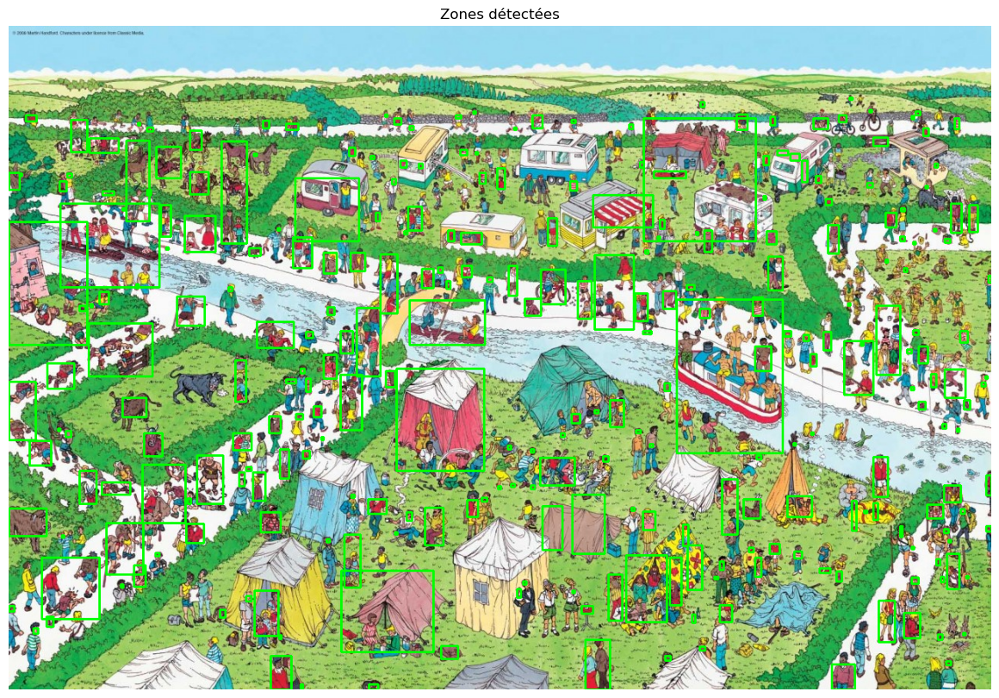

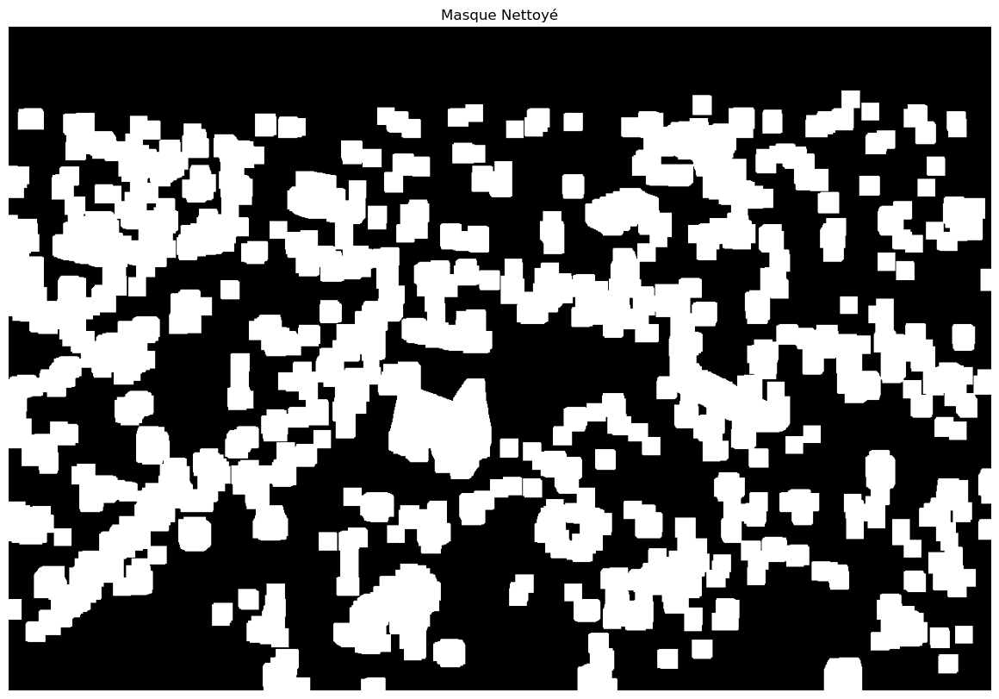

In [9]:
rois, mask, img_bbox = pretraitement_planche(planche_file)
img_rgb = cv2.cvtColor(img_bbox, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))
plt.imshow(img_rgb)
plt.title("Zones détectées")
plt.axis('off')
plt.show()

plt.figure(figsize=(15, 10))
plt.imshow(mask, cmap='gray')
plt.title("Masque Nettoyé")
plt.axis('off')
plt.show()

<h3>Etape 2 : Extraction de primitives locales</h3>

Sur les zones d'intérêt indentifiées à l'étape 1, nous allons maintenant appliquer l'algorithme SIFT pour obtenir les keypoints et leus descripteurs associés, afin de pouvoir comparer à notre base de référence d'images de Charlie, qui entrera en jeu dans l'étape suivante.

In [10]:
def extraire_sift_rois(image_bgr, rois):
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()

    sift_data = {}

    img_visualisation = image_bgr.copy()

    for (x, y, w, h) in rois:
        roi_gray = gray[y:y+h, x:x+w]
        keypoints, descriptors = sift.detectAndCompute(roi_gray, None)

        if descriptors is not None and len(keypoints) > 0:
            sift_data[(x, y, w, h)] = {'keypoints': keypoints, 'descriptors': descriptors}
            for kp in keypoints:
                kp.pt = (kp.pt[0] + x, kp.pt[1] + y)
            img_visualisation = cv2.drawKeypoints(img_visualisation, keypoints, img_visualisation, 
                                                  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    return sift_data, img_visualisation

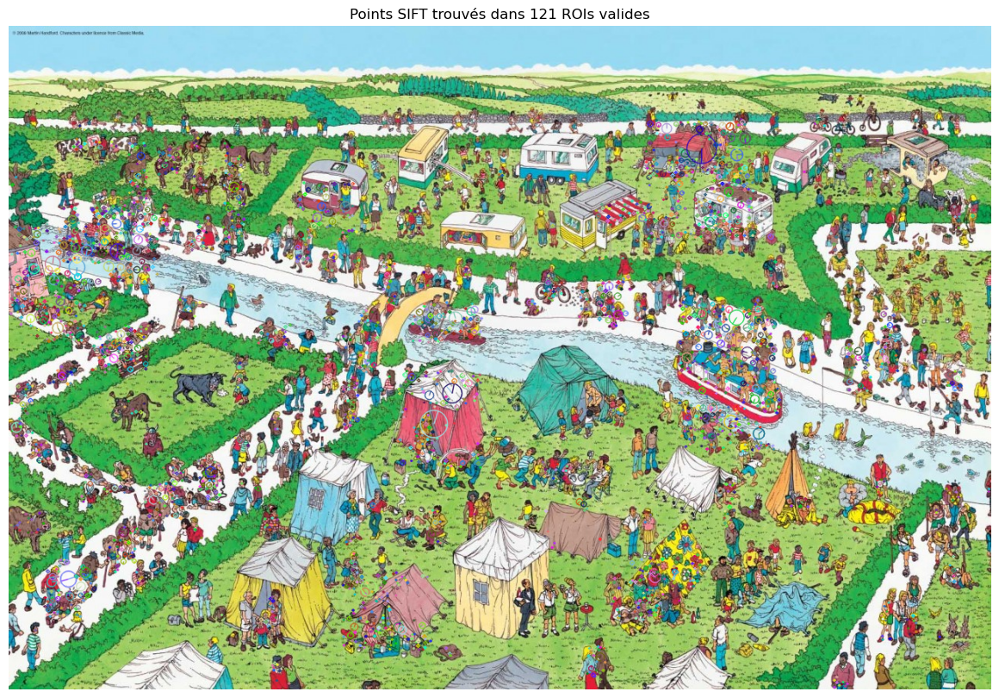

La première ROI possède une matrice de descripteurs de forme : (11, 128)


In [11]:
sift_data, img_sift = extraire_sift_rois(cv2.imread(planche_file), rois)

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_sift, cv2.COLOR_BGR2RGB))
plt.title(f"Points SIFT trouvés dans {len(sift_data)} ROIs valides")
plt.axis('off')
plt.show()


premiere_roi = list(sift_data.keys())[0]
descripteurs = sift_data[premiere_roi]['descriptors']
print(f"La première ROI possède une matrice de descripteurs de forme : {descripteurs.shape}") 

<h3>Etape 3 : Construction du dictionnaire visuel et quantification (BoW)</h3>

L'objectif de cette étape est de transformer la multitude de points SIFT (des vecteurs de dimension 128) de notre image en une représentation simplifiée en utilisant l'approche Bag of Words. Pour cela, nous créons d'abord un dictionnaire de « mots visuels » en regroupant les descripteurs les plus représentatifs de nos images de référence de Charlie (disponibles dans le dossier ./data_bow) via l'algorithme K-Means. Ensuite, chaque ROI de la planche est convertie en un histogramme : on compte simplement combien de fois chaque mot du dictionnaire apparaît dans la zone. Cela permet de caractériser Charlie par sa "composition" visuelle (ex: forte proportion de mots typiques des rayures ou des lunettes) plutôt que par une comparaison pixel à pixel.

Analyse de la silhouette pour différentes valeurs de K...
K=50, Silhouette Score=0.0406
K=52, Silhouette Score=0.0409
K=54, Silhouette Score=0.0393
K=56, Silhouette Score=0.0402
K=58, Silhouette Score=0.0385
K=60, Silhouette Score=0.0393
K=62, Silhouette Score=0.0397
K=64, Silhouette Score=0.0407
K=66, Silhouette Score=0.0397
K=68, Silhouette Score=0.0405
K=70, Silhouette Score=0.0351
K=72, Silhouette Score=0.0401
K=74, Silhouette Score=0.0375
K=76, Silhouette Score=0.0371
K=78, Silhouette Score=0.0394
K=80, Silhouette Score=0.0366
K=82, Silhouette Score=0.0365
K=84, Silhouette Score=0.0372
K=86, Silhouette Score=0.0357
K=88, Silhouette Score=0.0371
K=90, Silhouette Score=0.0364
K=92, Silhouette Score=0.0368
K=94, Silhouette Score=0.0380
K=96, Silhouette Score=0.0396
K=98, Silhouette Score=0.0372


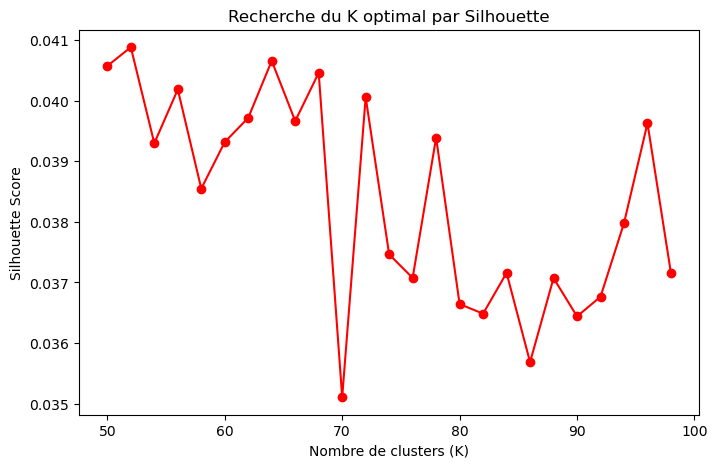

Le K optimal identifié est : 52


In [12]:
import os
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

def construire_vocabulaire(dossier_references, k_range=[i for i in range(50,100,2)]):
    '''
    Fonction construisant le vocabulaire à partir des images de référence.
    Fonctionnement : on calcule les descripteurs SIFT pour chaque image de référence. 
    Ensuite, on les regroupe par cluster, puis on définit notre vocabulaire comme l'ensemble
    des clusters.
    '''
    sift = cv2.SIFT_create()
    descripteurs_liste = []
    
    for filename in os.listdir(dossier_references):
        img = cv2.imread(os.path.join(dossier_references, filename), 0)
        if img is not None:
            _, des = sift.detectAndCompute(img, None)
            if des is not None:
                descripteurs_liste.append(des)
    
    tous_descripteurs = np.vstack(descripteurs_liste).astype(np.float32)
    
    # Échantillonnage pour accélérer le calcul 
    n_samples = min(5000, len(tous_descripteurs))
    indices = np.random.choice(len(tous_descripteurs), n_samples, replace=False)
    echantillon = tous_descripteurs[indices]

    best_k = k_range[0]
    best_score = -1
    scores = []

    print("Analyse de la silhouette pour différentes valeurs de K...")
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(echantillon)
        score = silhouette_score(echantillon, labels)
        scores.append(score)
        print(f"K={k}, Silhouette Score={score:.4f}")
        
        if score > best_score:
            best_score = score
            best_k = k

    # Visualisation
    plt.figure(figsize=(8, 5))
    plt.plot(k_range, scores, 'ro-')
    plt.xlabel('Nombre de clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.title('Recherche du K optimal par Silhouette')
    plt.show()

    print(f"Le K optimal identifié est : {best_k}")
    
    # Calcul final avec OpenCV
    bow_trainer = cv2.BOWKMeansTrainer(best_k)
    vocabulaire = bow_trainer.cluster(tous_descripteurs)
    
    return vocabulaire

def extraire_histogrammes_planche(sift_data, vocabulaire):
    # Initialisation du matcher pour trouver le mot le plus proche
    flann = cv2.FlannBasedMatcher_create()
    
    histograms_data = {}
    k = vocabulaire.shape[0] # Nombre de mots (50)

    for roi, data in sift_data.items():
        des = data['descriptors']
        
        if des is not None and len(des) > 0:
            des_float = des.astype(np.float32)
            vocab_float = vocabulaire.astype(np.float32)

            # On cherche pour chaque point de la ROI l'index du mot le plus proche
            # knnMatch avec k=1 renvoie le plus proche voisin
            matches = flann.knnMatch(des_float, vocab_float, k=1)

            #On crée l'histogramme (le "Sac de Mots")
            hist = np.zeros(k, dtype=np.float32)
            for m in matches:
                word_idx = m[0].trainIdx
                hist[word_idx] += 1

            # Normalisation L1 (pour que la somme de l'histogramme soit 1)
            hist /= (np.sum(hist) + 1e-6)

            histograms_data[roi] = hist
                
    return histograms_data
# Utilisation
vocab = construire_vocabulaire("./data_bow")
hists = extraire_histogrammes_planche(sift_data, vocab)

Visualisation d'un histogramme d'une ROI par rapport à celui du BOW

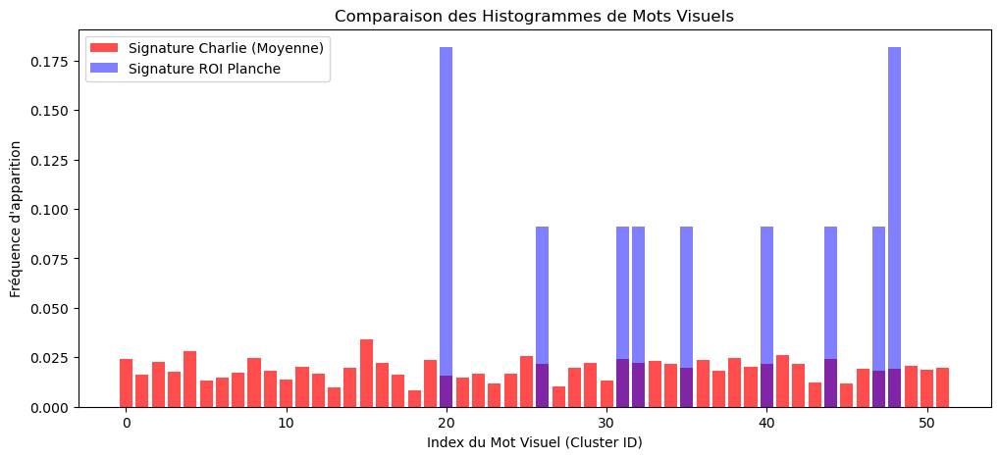

In [13]:
import matplotlib.pyplot as plt

# Calculer de l'histogramme moyen de référence 
# (même logique que pour la planche, mais sur les images de référence)
def calculer_signature_reference(dossier_refs, vocabulaire):
    sift = cv2.SIFT_create()
    flann = cv2.FlannBasedMatcher_create()
    hists_refs = []
    
    for filename in os.listdir(dossier_refs):
        img = cv2.imread(os.path.join(dossier_refs, filename), 0)
        if img is not None:
            _, des = sift.detectAndCompute(img, None)
            if des is not None:
                matches = flann.knnMatch(des.astype(np.float32), vocabulaire.astype(np.float32), k=1)
                h = np.zeros(len(vocabulaire), dtype=np.float32)
                for m in matches: h[m[0].trainIdx] += 1
                hists_refs.append(h / (np.sum(h) + 1e-6))
    
    return np.mean(hists_refs, axis=0)

signature_charlie = calculer_signature_reference("./data_bow", vocab)

# Visualisation
plt.figure(figsize=(12, 5))
plt.bar(range(len(signature_charlie)), signature_charlie, color='red', alpha=0.7, label="Signature Charlie (Moyenne)")
# On prend une ROI au hasard pour comparer
roi_test = list(hists.keys())[0]
plt.bar(range(len(hists[roi_test])), hists[roi_test], color='blue', alpha=0.5, label="Signature ROI Planche")

plt.title("Comparaison des Histogrammes de Mots Visuels")
plt.xlabel("Index du Mot Visuel (Cluster ID)")
plt.ylabel("Fréquence d'apparition")
plt.legend()
plt.show()

Identification de "meilleurs suspects"

In [14]:
def distance_chi2(h1, h2):
    # On utilise la formule standard du Chi-deux pour les histogrammes
    return 0.5 * np.sum(((h1 - h2) ** 2) / (h1 + h2 + 1e-10))

def selectionner_meilleurs_suspects(hists_planche, signature_ref, n_top=5):
    scores = []
    for roi, hist in hists_planche.items():
        # Histogrammes sont bien à plat (1D)
        dist = distance_chi2(hist.flatten(), signature_ref.flatten())
        scores.append((roi, dist))
    
    # Tri par distance croissante
    scores_tries = sorted(scores, key=lambda x: x[1])
    return scores_tries[:n_top]

# Identification des 10 zones les plus probables selon le BoW
meilleurs_suspects = selectionner_meilleurs_suspects(hists, signature_charlie, n_top=10)

print(f"Étape 3 terminée : {len(meilleurs_suspects)} suspects retenus.")
for i, (roi, score) in enumerate(meilleurs_suspects):
    print(f"Suspect n°{i+1} : ROI {roi} (Score : {score:.4f})")

Étape 3 terminée : 10 suspects retenus.
Suspect n°1 : ROI (870, 356, 138, 200) (Score : 0.0854)
Suspect n°2 : ROI (505, 446, 114, 133) (Score : 0.0932)
Suspect n°3 : ROI (827, 120, 146, 160) (Score : 0.1393)
Suspect n°4 : ROI (0, 255, 102, 160) (Score : 0.1435)
Suspect n°5 : ROI (67, 231, 129, 109) (Score : 0.1454)
Suspect n°6 : ROI (433, 709, 120, 106) (Score : 0.1747)
Suspect n°7 : ROI (104, 387, 83, 69) (Score : 0.1832)
Suspect n°8 : ROI (373, 198, 83, 82) (Score : 0.1834)
Suspect n°9 : ROI (277, 150, 33, 133) (Score : 0.1915)
Suspect n°10 : ROI (804, 689, 53, 87) (Score : 0.2317)


<h3>Etape 4 : Mise en correspondance et vérification géométrique (RANSAC)</h3>

L'objectif de cette étape est de valider lequel de nos meilleurs suspects possède la structure géométrique exacte de Charlie. Pour cela, nous allons utiliser l'algorithme RANSAC pour calculer une homographie, c'est-à-dire une transformation mathématique capable de projeter notre modèle de référence sur la planche en gérant les changements d'échelle, les rotations et les inclinaisons. Si un nombre suffisant de points s'alignent parfaitement selon cette transformation, nous considérons que Charlie est localisé.

In [15]:
def valider_geometrie_multi_modeles(meilleurs_suspects, dossier_refs, min_match_count=6):
    sift = cv2.SIFT_create()
    flann = cv2.FlannBasedMatcher_create()
    
    modeles = []
    for i in range(1, 22):
        path = os.path.join(dossier_refs, f"{i}.png")
        img = cv2.imread(path, 0)
        if img is not None:
            kp, des = sift.detectAndCompute(img, None)
            if des is not None:
                modeles.append({'kp': kp, 'des': des, 'shape': img.shape, 'id': i})

    resultats_finaux = []

    for roi, score_bow in meilleurs_suspects:
        x_roi, y_roi, w_roi, h_roi = roi
        kps_planche = sift_data[roi]['keypoints']
        des_planche = sift_data[roi]['descriptors'].astype(np.float32)

        # On crée des copies des points en coordonnées locales à la ROI
        # L'homographie échoue si on compare des points à (10,10) avec des points à (1500, 2000)
        pts_planche_locaux = []
        for kp in kps_planche:
            pts_planche_locaux.append((kp.pt[0] - x_roi, kp.pt[1] - y_roi))
        pts_planche_locaux = np.float32(pts_planche_locaux).reshape(-1, 1, 2)

        meilleur_match_pour_roi = None
        max_inliers = 0

        for mod in modeles:
            matches = flann.knnMatch(mod['des'].astype(np.float32), des_planche, k=2)
            
            # Ratio de Lowe de 0.8 pour plus de flexibilité
            good_matches = [m for m, n in matches if m.distance < 0.8 * n.distance]

            if len(good_matches) >= min_match_count:
                src_pts = np.float32([mod['kp'][m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
                # On utilise les index des matches pour piocher dans nos points locaux
                dst_pts = np.float32([pts_planche_locaux[m.trainIdx] for m in good_matches]).reshape(-1, 1, 2)
                
                # RANSAC (seuil de 5.0 pixels de tolérance)
                M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
                
                if M is not None:
                    inliers = np.sum(mask)
                    if inliers > max_inliers:
                        max_inliers = inliers
                        meilleur_match_pour_roi = (M, mod['shape'], mod['id'])

        if max_inliers >= min_match_count:
            print(f"Match trouvé ! ROI {roi} avec modèle {meilleur_match_pour_roi[2]} ({max_inliers} inliers)")
            resultats_finaux.append({
                'roi': roi, 
                'inliers': max_inliers, 
                'homographie': meilleur_match_pour_roi[0],
                'model_shape': meilleur_match_pour_roi[1]
            })
        else:
            print(f"ROI {roi} rejetée : trop peu d'inliers ({max_inliers})")

    return resultats_finaux

charlie_trouve = valider_geometrie_multi_modeles(meilleurs_suspects, "./data_bow/", min_match_count=10)

Match trouvé ! ROI (870, 356, 138, 200) avec modèle 12 (10 inliers)
Match trouvé ! ROI (505, 446, 114, 133) avec modèle 1 (10 inliers)
Match trouvé ! ROI (827, 120, 146, 160) avec modèle 1 (14 inliers)
ROI (0, 255, 102, 160) rejetée : trop peu d'inliers (9)
ROI (67, 231, 129, 109) rejetée : trop peu d'inliers (9)
Match trouvé ! ROI (433, 709, 120, 106) avec modèle 12 (12 inliers)
Match trouvé ! ROI (104, 387, 83, 69) avec modèle 12 (13 inliers)
Match trouvé ! ROI (373, 198, 83, 82) avec modèle 1 (13 inliers)
ROI (277, 150, 33, 133) rejetée : trop peu d'inliers (6)
ROI (804, 689, 53, 87) rejetée : trop peu d'inliers (6)


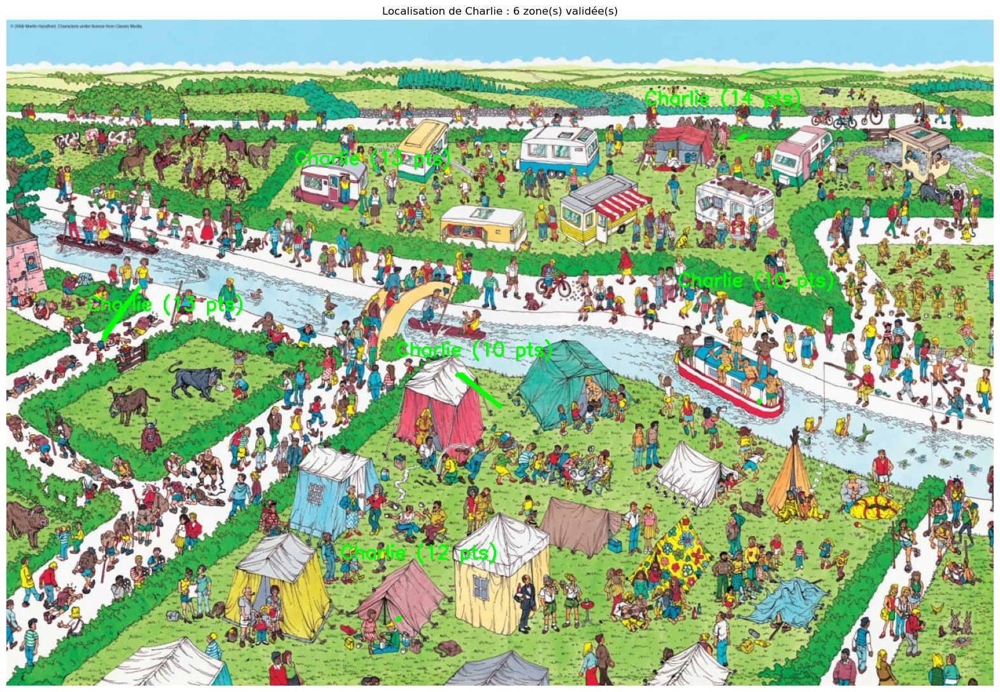

In [16]:
def afficher_charlie_localise(image_planche_path, resultats_finaux):
    image_originale = cv2.imread(image_planche_path)
    if image_originale is None:
        return
    
    image_visu = image_originale.copy()

    for res in resultats_finaux:
        roi = res['roi']
        M = res['homographie']
        h_mod, w_mod = res['model_shape'][:2]
        x_roi, y_roi = roi[0], roi[1]

        # Définition des coins du modèle (en local : 0,0 jusqu'à h,w)
        pts_modele = np.float32([[0, 0], [0, h_mod-1], [w_mod-1, h_mod-1], [w_mod-1, 0]]).reshape(-1, 1, 2)

        # Projection des coins sur la ROI grâce à l'homographie otbenue par RANSAC
        coins_projetes = cv2.perspectiveTransform(pts_modele, M)

        # On replace les coins dans le référentiel global de la planche
        coins_globaux = coins_projetes + np.float32([x_roi, y_roi])

        # Dessin du polygone en vert
        image_visu = cv2.polylines(image_visu, [np.int32(coins_globaux)], True, (0, 255, 0), 3, cv2.LINE_AA)
        
        # Ajout du nombre d'inliers au-dessus
        cv2.putText(image_visu, f"Charlie ({res['inliers']} pts)", (x_roi, y_roi - 10), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    plt.figure(figsize=(20, 15))
    plt.imshow(cv2.cvtColor(image_visu, cv2.COLOR_BGR2RGB))
    plt.title(f"Localisation de Charlie : {len(resultats_finaux)} zone(s) validée(s)")
    plt.axis('off')
    plt.show()

# Utilisation
afficher_charlie_localise(planche_file, charlie_trouve)

<h3> Étape 5 : Raffinement par analyse de texture et segmentation locale </h3>

Enfin, pour parfaire la détection et éliminer tout risque de faux positif (exemple : un objet rayé rouge et blanc qui ne serait pas Charlie), nous ajoutons une étape de validation de texture. Cette phase repose sur l'analyse des fréquences spatiales : le pull de Charlie présente une alternance régulière de fortes transitions d'intensité. En utilisant le filtre de Canny, nous extrayons les contours au sein de la zone détectée. Si la densité et l'orientation des contours correspondent à la signature fréquentielle des rayures, la détection est définitivement validée.

Début du raffinement sur 6 candidat(s)...
Test candidat n°1 : 14 inliers, densité texture : 0.2728
IDENTIFICATION CONFIRMÉE : Charlie trouvé en (827, 120) !


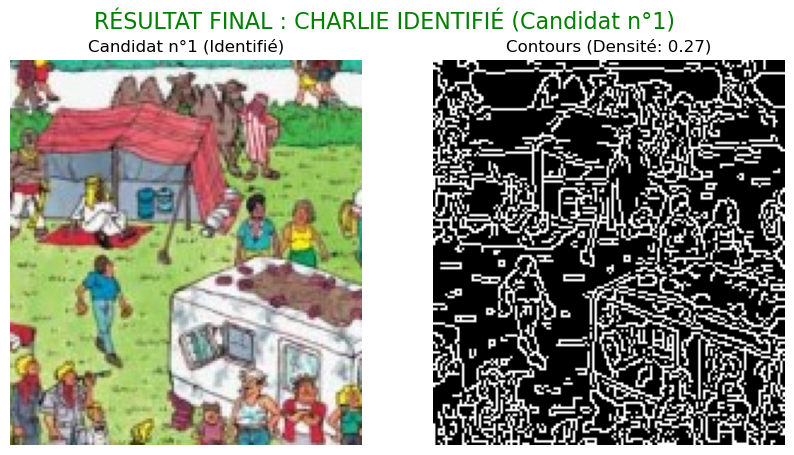

In [ ]:
def raffinement_et_identification_sequentiel(image_planche_path, resultats_geometriques):
    img = cv2.imread(image_planche_path)
    
    # Ordonner les candidats du plus probable au moins probable (par nombre d'inliers)
    candidats_tries = sorted(resultats_geometriques, key=lambda x: x['inliers'], reverse=True)
    
    charlie_identifie = False
    
    print(f"Début du raffinement sur {len(candidats_tries)} candidat(s)...")

    for i, candidat in enumerate(candidats_tries):
        # Utilisation de 'roi_global' si vous utilisez la version AKAZE avec padding
        roi_coords = candidat.get('roi_global') or candidat.get('roi')
        x, y, w, h = roi_coords
        
        # Extraction et prétraitement de la zone
        crop = img[y:y+h, x:x+w]
        if crop.size == 0: continue
        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        
        # Détection de contours via Canny
        edges = cv2.Canny(gray_crop, 100, 200)
        
        # Calcul de la densité de texture (ratio pixels de contours / surface)
        densite_contours = np.sum(edges > 0) / (w * h)
        
        print(f"Test candidat n°{i+1} : {candidat['inliers']} inliers, densité texture : {densite_contours:.4f}")

        # Validation par seuil empirique, sinon on change de candidat
        if densite_contours > 0.05:
            charlie_identifie = True
            
            # Affichage du succès
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
            plt.title(f"Candidat n°{i+1} (Identifié)")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(edges, cmap='gray')
            plt.title(f"Contours (Densité: {densite_contours:.2f})")
            plt.axis('off')
            
            print(f"IDENTIFICATION CONFIRMÉE : Charlie trouvé en ({x}, {y})")
            plt.suptitle(f"RÉSULTAT FINAL : CHARLIE IDENTIFIÉ (Candidat n°{i+1})", fontsize=16, color='green')
            plt.show()
            
            # On a trouvé Charlie, on arrête la boucle
            break
        else:
            print(f"Candidat n°{i+1} rejeté (faux positif textuel).")

    if not charlie_identifie:
        print("Aucun des candidats géométriques n'a passé le test de texture.")

raffinement_et_identification_sequentiel(planche_file, charlie_trouve)